In [13]:
"""Importing libraries"""
import matplotlib.pyplot as plt
import imageio
import pandas as pd
import numpy as np
import math
import os
from IPython.display import Image
from random import uniform, randint
pd.options.mode.chained_assignment = None
plt.rcParams['figure.figsize'] = [10, 6]

"""Function to make inappropriate values as zero"""
def polish(sr):
    for i in range(1, sr.size):
        if sr[i] == ' ' or math.isnan(float(sr[i])):
            sr[i] = 0
    return sr

In [14]:
"""Death rate data"""
data_dr = pd.read_excel("2-CBR.xlsx", header=2, skipfooter=1)

mat = pd.DataFrame()
for i in data_dr.index:
    mat = mat.append(pd.Series(polish(data_dr.iloc[i])))

data_dr = mat.drop(36)

In [15]:
"""Birth rate data"""
data_br = pd.read_excel("3-CDR.xlsx", header=2, skipfooter=1)

mat = pd.DataFrame()
for i in data_br.index:
    mat = mat.append(pd.Series(polish(data_br.iloc[i])))

data_br = mat.drop(36)

In [16]:
"""Population Data"""
data_pop = pd.read_excel("pop.xlsx")

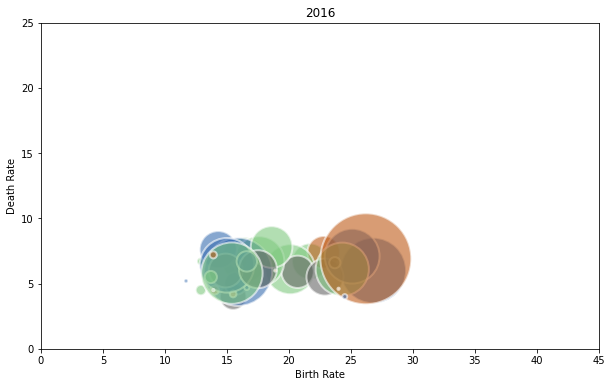

In [17]:
"""Plotting"""
n = data_br.index.size
rad = data_pop['Pop']*50000
cat = [randint(1, 5) for i in range(n)]     # category

os.system("rm -rf data; mkdir data;")

for c in data_br.columns[:-1]:
  dr = data_dr[c]
  br = data_br[c]
  
  plt.clf()
  plt.title(c)
  plt.scatter(dr, br, s=rad, c=cat, cmap="Accent", alpha=0.6, edgecolors="white", linewidth=2)
  plt.xticks(np.arange(0, 50, step=5))
  plt.yticks(np.arange(0, 30, step=5))
  plt.xlabel('Birth Rate')
  plt.ylabel('Death Rate')
  plt.savefig('data/'+c+'.png', dpi=200)

Completed.


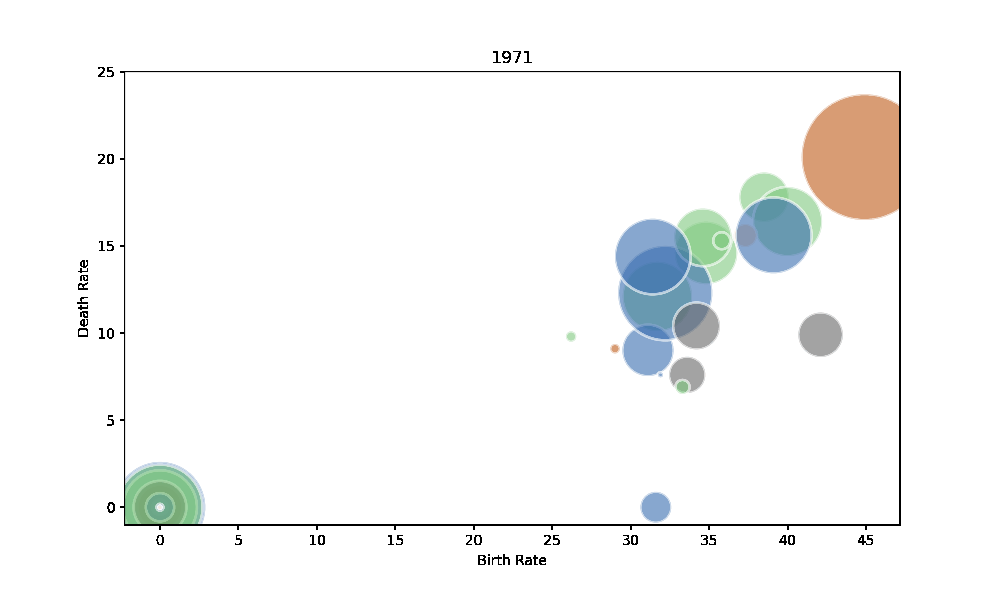

In [18]:
"""Making a gif"""
images = []
filenames = ['data/'+str(1971+i)+'.png' for i in range(46)]
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('movie.gif', images, duration=0.5)

print('Completed.')
Image(filename='movie.gif')